# Pre-Processing of Data

In [3]:
# Misc
import os
import sys
from timeit import default_timer as timer 
import datetime
now = datetime.datetime.now()

# Data manipulation
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from netCDF4 import Dataset
import numpy as np


# Sanity check for jupyter notebooks
print("Current working directory:", os.getcwd())

Current working directory: c:\Users\gabri\Documents\GitHub\IceClassic\PreProcessData


#  Data Sources
Al the data files are on the google drive, temporarily I also upload them toa repo to access easier [ICE Classic Reviewed Data](https://github.com/GabrielFollet/ICE_data_dump.git) from notebooks.



## General 
The tripod is on the Tenana River in Nenana, a couple hundred feet from the [Mears Memorial Bridge](https://www.google.com/maps/place/Mears+Memorial+Bridge/@64.5673074,-149.0813003,17z/data=!3m1!4b1!4m6!3m5!1s0x513297804d87b329:0xbf991116ff77a5ad!8m2!3d64.5673074!4d-149.0787254!16s%2Fm%2F04zw16f?entry=ttu) (64.57°, -149.08°)

## 1. Temperature
### 1.1 [Berkeley Earth Global Temperature](https://berkeleyearth.org/)
- Average daily temperature 1880/01/01 to 2022/07/31
- Resolution 1° x  1°
### 1.2 [NOAA GHCN Data (Temperature)](https://www.ncdc.noaa.gov/cdo-web/datasets/GHCND/stations/GHCND:USW00026435/detail)
- Nearby weather stations
    - NENANA MUNICIPAL AIRPORT, AK US (USW00026435)
    - FAIRBANKS INTERNATIONAL AIRPORT, AK US (USW00026411)
- Maxima, minima and simply-averaged daily temperature 1916/12/01 to 2024/02/01
### 1.3 [USGS Water Data (Temperature) ](https://waterdata.usgs.gov/nwis/rt)
-  Nearby weather station USGS 15515500 TANANA R AT NENANA AK
- Maxima, minima and simply-averaged daily temperature 2016/04/25  onwards
## 2. Precipitation
### 2.1 [NOAA GHCN Data (Precipitation)](https://www.ncdc.noaa.gov/cdo-web/datasets/GHCND/stations/GHCND:USW00026435/detail)
- Nearby weather stations
    - NENANA MUNICIPAL AIRPORT, AK US (USW00026435)
    - FAIRBANKS INTERNATIONAL AIRPORT, AK US (USW00026411)
- Daily precipitation, snow and snow depth data (humidity and wind also available)

## 3. Discharge
### 3.1 [USGS Water Data ](https://waterdata.usgs.gov/nwis/rt)
-  Nearby weather stations
    - USGS 15515500 TANANA R AT NENANA AK
    - USGS 15485500 Tanana R at Fairbanks AK
- Discharge data from 1962-05-01 and 1973-05-01 respectively

## 4. Ice Thickness & Break-up Times
### 4.1 [Nenana ICE Classic](https://www.nenanaakiceclassic.com/ice) 
- Ice thickness data from 1989.
- Frequency of measurement is irregular ( more frequent as the expected date ( from organizers) approaches?? maybe extract info)

In [4]:
#=======================================================================================================================#
# Loading Berkeley Earth Global Temperature
Temp_Berkeley=pd.read_csv('https://github.com/GabrielFollet/ICE_data_dump/blob/main/Berkeley%20temp%20data%20updated.txt?raw=true',skiprows=48,index_col=0,delimiter=' ' ) 
Temp_Berkeley.index = pd.to_datetime(Temp_Berkeley.index)
Temp_Berkeley.columns.values[0] = 'TAVG [C]'
#=======================================================================================================================#
# Loading NOAA GHCN Data
columns_to_import = ['DATE','PRCP', 'SNOW','SNWD','TMAX','TMIN'] # there are other field but the coverage is limited

# NENANA Airport
Nenana_pp= pd.read_csv('https://github.com/GabrielFollet/ICE_data_dump/blob/main/NOAA_PRPP_NENANA.txt?raw=true',usecols=columns_to_import,skiprows=629,delimiter='\t')
Nenana_pp['DATE'] = pd.to_datetime(Nenana_pp['DATE'])
Nenana_pp.set_index('DATE', inplace=True)
# Fairbanks Airport
Fairbanks_pp= pd.read_csv('https://github.com/GabrielFollet/ICE_data_dump/blob/main/NOAA_PRPP_FAIRBANKS.txt?raw=true',usecols=columns_to_import,skiprows=629,delimiter='\t')
Fairbanks_pp['DATE'] = pd.to_datetime(Fairbanks_pp['DATE'])
Fairbanks_pp.set_index('DATE', inplace=True)

Fairbanks_pp.head()
#======================================================================================================================#
#Loading USGS Data
#======================================================================================================================#
# TENANA R Nenana
cols=['datetime','1103_00010_00001','1104_00010_00002','1105_00010_00003','1106_00060_00003']
dict1= {'1103_00010_00001': 'Max water temp [C]', '1104_00010_00002': 'Min water temp [C]','1105_00010_00003': 'Mean water temp [C]','1106_00060_00003':'Mean Discharge [m3/s]'}
Nenana_R_1= pd.read_csv('https://github.com/GabrielFollet/ICE_data_dump/blob/main/USGS_Tenana_R_Nenana.txt?raw=true ',skiprows=33,usecols=cols,delimiter='\t')
Nenana_R_1.rename(columns=dict1,
          inplace=True)
Nenana_R_1['datetime'] = pd.to_datetime(Nenana_R_1['datetime'])
Nenana_R_1.set_index('datetime', inplace=True)

# changing units from ft^3/s to m3/s ( when we change the name we change it to new units ( original unit are ft^3 as we can see in documentation)
Nenana_R_1['Mean Discharge [m3/s]']= pd.to_numeric(Nenana_R_1['Mean Discharge [m3/s]'])
Nenana_R_1['Mean Discharge [m3/s]'] = Nenana_R_1['Mean Discharge [m3/s]']*0.02832 # to  m^3/s (cubic meters per second) 



# TENANA R Fairbanks
cols=['datetime','1085_00060_00003']
dict1= {'1085_00060_00003':'Mean Discharge [m3/s]'}
Nenana_R_2= pd.read_csv('https://github.com/GabrielFollet/ICE_data_dump/blob/main/USGS_Tenana_R_Fairbanks.txt?raw=true',skiprows=29,usecols=cols,delimiter='\t')
Nenana_R_2.rename(columns=dict1,
          inplace=True)
Nenana_R_2['datetime'] = pd.to_datetime(Nenana_R_2['datetime'])
Nenana_R_2.set_index('datetime', inplace=True)

# changing units from ft^3/s to m3/s
Nenana_R_2['Mean Discharge [m3/s]']= pd.to_numeric(Nenana_R_2['Mean Discharge [m3/s]'])
Nenana_R_2['Mean Discharge [m3/s]'] = Nenana_R_2['Mean Discharge [m3/s]']*0.02832 # to  m^3/s (cubic meters per second) 

#======================================================================================================================#
#Loading ICE Classic Data
#======================================================================================================================#

#Ice Thickness
cols=['timestamp','IceThickness [cm]']
ice_thickness=pd.read_csv('https://github.com/GabrielFollet/ICE_data_dump/blob/main/Nenana_Ice_Classic_Ice_Thickness.txt?raw=true',skiprows=6,usecols=cols,delimiter='\t')
ice_thickness['timestamp'] = pd.to_datetime(ice_thickness['timestamp'])
ice_thickness.set_index('timestamp', inplace=True)

# Break-up-times
break_up_times=pd.read_csv('https://github.com/GabrielFollet/ICE_data_dump/blob/main/BreakUpTimes.csv?raw=true')
break_up_times.head()
break_up_times['timestamp'] = pd.to_datetime(break_up_times[['Year', 'Month', 'Day']])  # want index wiht only date not time
break_up_times['timestamps'] = pd.to_datetime(break_up_times['timestamp'])
break_up_times.set_index('timestamp', inplace=True)

# A collection of super simple plots

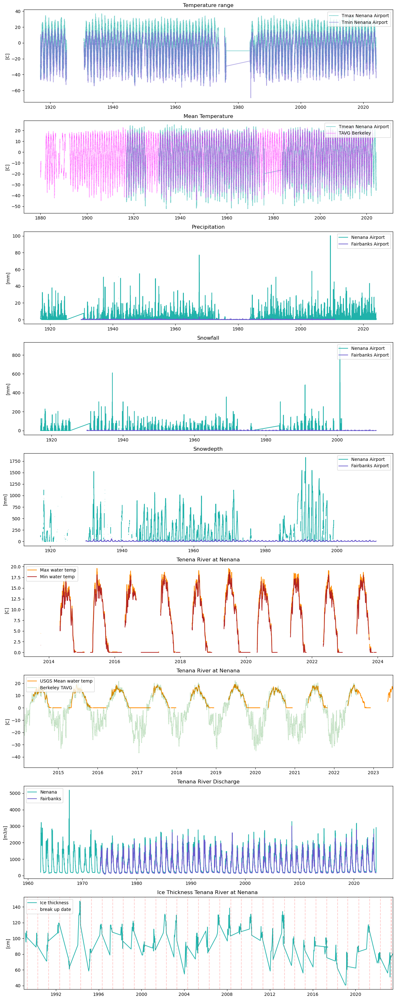

In [5]:
fig, ax1 = plt.subplots(9,1,figsize=(15, 40)) 
color1='lightseagreen'
color2='slateblue'
color3='darkorange'
color4='firebrick'



ax1[0].plot(Nenana_pp['TMAX'],marker=',',label="Tmax Nenana Airport",color=color1,alpha=0.5)
ax1[0].plot(Nenana_pp['TMIN'],marker=',',label="Tmin Nenana Airport",color=color2,alpha=0.5)
ax1[0].tick_params(axis='y')
ax1[0].set_ylabel("[C]")
ax1[0].legend(loc='upper right')
ax1[0].set_title("Temperature range")


ax1[1].plot(0.5*(Nenana_pp['TMAX']+Nenana_pp['TMIN']),marker=',',label="Tmean Nenana Airport",color=color1,alpha=0.5)
ax1[1].plot(Temp_Berkeley,marker=',',label="TAVG Berkeley ",color='magenta',alpha=0.3)
ax1[1].tick_params(axis='y')
ax1[1].tick_params(axis='y')
ax1[1].set_ylabel("[C]")
ax1[1].legend(loc='upper right')
ax1[1].set_title("Mean Temperature")


ax1[2].plot(Nenana_pp['PRCP'],marker=',',label="Nenana Airport",color=color1)
ax1[2].plot(Fairbanks_pp['PRCP'],marker=',',label="Fairbanks Airport",color=color2)
ax1[2].tick_params(axis='y')
ax1[2].set_ylabel("[mm]")
ax1[2].legend(loc='upper right')
ax1[2].set_title("Precipitation")


ax1[3].plot(Nenana_pp['SNOW'],marker=',',label="Nenana Airport",color=color1)
ax1[3].plot(Fairbanks_pp['SNOW'],marker=',',label="Fairbanks Airport",color=color2)
ax1[3].tick_params(axis='y')
ax1[3].set_ylabel("[mm]")
ax1[3].legend(loc='upper right')
ax1[3].set_title("Snowfall")


ax1[4].plot(Nenana_pp['SNWD'],marker=',',label="Nenana Airport",color=color1)
ax1[4].plot(Fairbanks_pp['SNWD'],marker=',',label="Fairbanks Airport",color=color2)
ax1[4].tick_params(axis='y')
ax1[4].set_ylabel("[mm]")
ax1[4].legend(loc='upper right')
ax1[4].set_title("Snowdepth")

ax1[5].plot(Nenana_R_1['Max water temp [C]'],marker=',',label="Max water temp",color=color3)
ax1[5].plot(Nenana_R_1['Min water temp [C]'],marker=',',label="Min water temp",color=color4)
ax1[5].tick_params(axis='y')
ax1[5].set_ylabel("[C]")
ax1[5].legend(loc='upper left')
ax1[5].set_title("Tenena River at Nenana")

ax1[6].plot(Nenana_R_1['Mean water temp [C]'],marker=',',label="USGS Mean water temp",color=color3)
ax1[6].plot(Temp_Berkeley,marker=',',label="Berkeley TAVG",color='green',alpha=0.2)
ax1[6].tick_params(axis='y')
ax1[6].set_ylabel("[C]")
ax1[6].legend(loc='upper left')
ax1[6].set_title("Tenana River at Nenana")
ax1[6].set_xlim(pd.Timestamp('2014-02-15'), pd.Timestamp('2023-07-01'))

ax1[7].plot(Nenana_R_1['Mean Discharge [m3/s]'],marker=',',label="Nenana",color=color1)
ax1[7].plot(Nenana_R_2['Mean Discharge [m3/s]'],marker=',',label="Fairbanks",color=color2)
ax1[7].tick_params(axis='y')
ax1[7].set_ylabel("[m3/s]")
ax1[7].legend(loc='upper left')
ax1[7].set_title("Tenana River Discharge")


ax1[8].plot(ice_thickness,marker=',',label="Ice thickness",color=color1)
ax1[8].tick_params(axis='y')
ax1[8].set_ylabel("[cm]")
ax1[8].set_title("Ice Thickness Tenana River at Nenana ")
# Plot vertical lines for each index value
for datetime_value in break_up_times.index:
    plt.axvline(x=datetime_value, color='r', linestyle='--',alpha=0.2)
plt.axvline(x=datetime_value, color='r', linestyle='--',alpha=0.2,label="break up date" ) # lazy way to get only onw legend
ax1[8].set_xlim(pd.Timestamp('1989-01-01'), pd.Timestamp('2023-07-01'))
ax1[8].legend(loc='upper left')
plt.show()

## An Interactive Plot

In [3]:
import plotly.graph_objects as go

# Create figure
fig = go.Figure()

# Add traces
fig.add_trace(go.Scatter(x=Temp_Berkeley.index,y=Temp_Berkeley["TAVG [C]"],name="air temp",yaxis="y",line=dict(color='gold')))
fig.add_trace(go.Scatter(x=Nenana_pp.index,y=Nenana_pp["PRCP"],name="rain",yaxis="y2",line=dict(color='lightseagreen')))
fig.add_trace(go.Scatter(x=Nenana_pp.index,y=Nenana_pp["SNOW"],name="snow",yaxis="y2",line=dict(color='slateblue')))
fig.add_trace(go.Scatter(x=Nenana_pp.index,y=Nenana_pp["SNWD"],name='snow depth',yaxis="y2",line=dict(color='magenta')))
fig.add_trace(go.Scatter(x=Nenana_R_1.index,y=Nenana_R_1["Mean water temp [C]"],name="water temp",yaxis="y",line=dict(color='firebrick')))
fig.add_trace(go.Scatter(x=Nenana_R_1.index,y=Nenana_R_1["Mean Discharge [m3/s]"],name="discharge",yaxis="y3",line=dict(color='dodgerblue')))
fig.add_trace(go.Scatter(x=ice_thickness.index,y=ice_thickness["IceThickness [cm]"],name="ice depth",yaxis="y4",line=dict(color='navy')))

# style all the traces
fig.update_traces(hoverinfo="name+x+text",line={"width": 0.5},marker={"size": 8},mode="lines",showlegend=False)

# Add break-up times lines
shapes = []
for date in break_up_times.index:
    shape = {
        "type": "line",
        "xref": "x",
        "yref": "paper",
        "x0": date,
        "y0": 0,
        "x1": date,
        "y1": 1,
        "line": {
            "color": 'red',
            "width": 0.4,
            "dash": 'dot'
        }
    }
    shapes.append(shape)

# Add shapes to layout
fig.update_layout(shapes=shapes)
# Update axes
fig.update_layout(
    title="Global Variables-Tenana River at Nenana",
    xaxis=dict(range=["1990-01-01","1995-12-31"],
            rangeslider=dict(autorange=True,range=["2012-10-31 18:36:37.3129", "2016-05-10 05:23:22.6871"]),type="date"),
    yaxis=dict(anchor="x",autorange=True,domain=[0, 0.25],linecolor="black",mirror=True,range=[-55.0, 25],
            showline=True,side="left",tickfont={"color": "black"},tickmode="auto",ticks="",title="[C]",
            titlefont={"color": "black"},type="linear",zeroline=False),
    yaxis2=dict(anchor="x",autorange=True,domain=[0.25, 0.5],linecolor="black",mirror=True,range=[0, 40],
            showline=True,side="left",tickfont={"color": "black"},tickmode="auto",ticks="",title="[mm]",
            titlefont={"color": "black"},type="linear",zeroline=False),
    yaxis3=dict(anchor="x",autorange=True,domain=[0.5, 0.75],linecolor="black",mirror=True,range=[0,30],
            showline=True,side="left",tickfont={"color": "black"},tickmode="auto",ticks="",title="[m3/s]",
            titlefont={"color": "black"},type="linear",zeroline=False),
    yaxis4=dict(anchor="x",autorange=True,domain=[0.75, 1],linecolor="black",mirror=True,range=[0,200],
            showline=True,side="left",tickfont={"color": "black"},tickmode="auto",ticks="",title="[cm]",
            titlefont={"color": "black"},type="linear",zeroline=False))


# Update layout
fig.update_layout(
    dragmode="zoom",hovermode="x",legend=dict(traceorder="reversed"),height=800,template="plotly_white",
        margin=dict(t=90,b=90),)

fig.show()

## Maybe relevant??
While entering the ice thickness measurement for the missing years (2016-2023) i got the feeling that, independently of the ice thickness, the frequency of measurement get higher approaching the break up time ( makes sense, the people doing the measurement inherently know when the ice is beginning to break and start doing more measurements ???). Maybe I am reading a little to much into it, I tried to quantify it , but i have the feeling that my plots are in someways simply equivalent to the distribution of break up times

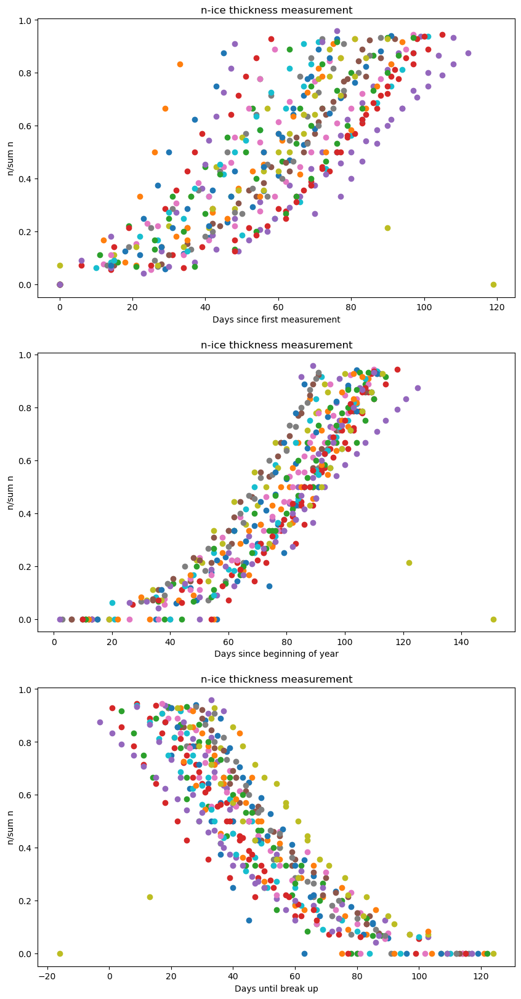

In [5]:
fig, ax1 = plt.subplots(3,1,figsize=(10,20)) 
for i in range ((ice_thickness.index.max().year - ice_thickness.index.min().year)):
    current_year=ice_thickness.index.min().year+i
    data_of_year=ice_thickness[ice_thickness.index.year==current_year]

    days_since_first_date= (data_of_year.index - data_of_year.index.min()).days
    days_since_beginning_of_year= data_of_year.index.dayofyear - 1
    day_of_break_up_since_beginning_of_year = break_up_times.index[i].dayofyear-1
    days_until_break_up = day_of_break_up_since_beginning_of_year-days_since_beginning_of_year
    n=len(data_of_year)
    N=np.arange(n)
    ax1[0].scatter(days_since_first_date,N/n)
    ax1[1].scatter(days_since_beginning_of_year,N/n)
    ax1[2].scatter(days_until_break_up,N/n)

ax1[0].set_ylabel("n/sum n")
ax1[0].set_xlabel("Days since first measurement")
ax1[0].set_title("n-ice thickness measurement")
ax1[1].set_ylabel("n/sum n")
ax1[1].set_xlabel("Days since beginning of year")
ax1[1].set_title("n-ice thickness measurement")
ax1[2].set_ylabel("n/sum n")
ax1[2].set_xlabel("Days until break up")
ax1[2].set_title("n-ice thickness measurement")

plt.show()


also the green dot is clearly wrong ( ice thickness after break up??? review data may be my own mistake while entering the data), from 140 since beginning of year, its 2002